In [63]:
%matplotlib inline
# %matplotlib notebook
from datetime import datetime,timedelta
import os
import json
import requests
import hmac
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as st
from scipy.stats import linregress
import time
import pandas_datareader as pdr
import datetime as dt
import seaborn as sns
import plotly.express as px




In [64]:
file = "resources/2021_2022_FTX_USDBTC_1H.csv"

btcusd_1h = pd.read_csv(file)
df = btcusd_1h
df
# df = btcusd_1h
# df

,date,hour,open,high,low,close,volume(BTC),ohlc4,SMA48,average_true_range,EMA9,EMA48,10x short,25x short,50x short,100x short,10x long,25x long,50x long,100x long
0,2021-01-01 05:00:00,5.0,29280.5,29296.0,29146.5,29240.0,5.523795e+06,29240.75,NaN,NaN,29240.75,29240.75,32310.22,30301.30,29686.04,29390.67,26703.88,28251.93,28808.62,29092.35
1,2021-01-01 06:00:00,6.0,29240.0,29315.0,29127.5,29231.0,7.436047e+06,29228.38,NaN,NaN,29238.28,29240.24,32307.49,30298.73,29683.53,29388.18,26701.62,28249.54,28806.18,29089.89
2,2021-01-01 07:00:00,7.0,29231.0,29241.5,28887.0,29168.0,8.430755e+06,29131.88,NaN,NaN,29217.00,29235.82,32283.97,30276.68,29661.92,29366.80,26682.19,28228.98,28785.22,29068.72
3,2021-01-01 08:00:00,8.0,29168.0,29251.0,28928.5,29061.0,7.003067e+06,29102.12,NaN,NaN,29194.02,29230.36,32258.59,30252.87,29638.60,29343.70,26661.21,28206.78,28762.58,29045.86
4,2021-01-01 09:00:00,9.0,29061.0,29379.5,29041.5,29275.0,5.764370e+06,29189.25,NaN,NaN,29193.07,29228.69,32257.53,30251.88,29637.63,29342.74,26660.33,28205.86,28761.64,29044.91
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14154,2022-08-13 23:00:00,23.0,24390.0,24504.0,24368.0,24447.0,1.217444e+07,24427.25,24263.13,148.50,24468.45,24336.94,27036.96,25355.91,24841.07,24593.91,22345.62,23641.02,24106.85,24344.27
14155,2022-08-14 00:00:00,0.0,24447.0,24521.0,24350.0,24520.0,8.810785e+06,24459.50,24274.17,147.36,24466.66,24341.95,27034.99,25354.05,24839.25,24592.11,22343.98,23639.29,24105.09,24342.49
14156,2022-08-14 01:00:00,1.0,24520.0,24645.0,24417.0,24597.0,1.683024e+07,24544.75,24286.69,147.36,24482.28,24350.22,27052.24,25370.24,24855.11,24607.80,22358.25,23654.38,24120.47,24358.03
14157,2022-08-14 02:00:00,2.0,24597.0,24625.0,24508.0,24612.0,8.566078e+06,24585.50,24299.66,143.71,24502.92,24359.83,27075.05,25391.63,24876.06,24628.55,22377.10,23674.32,24140.81,24378.57


In [65]:
df = df.set_index('date')
df

,hour,open,high,low,close,volume(BTC),ohlc4,SMA48,average_true_range,EMA9,EMA48,10x short,25x short,50x short,100x short,10x long,25x long,50x long,100x long
date,,,,,,,,,,,,,,,,,,,
2021-01-01 05:00:00,5.0,29280.5,29296.0,29146.5,29240.0,5.523795e+06,29240.75,NaN,NaN,29240.75,29240.75,32310.22,30301.30,29686.04,29390.67,26703.88,28251.93,28808.62,29092.35
2021-01-01 06:00:00,6.0,29240.0,29315.0,29127.5,29231.0,7.436047e+06,29228.38,NaN,NaN,29238.28,29240.24,32307.49,30298.73,29683.53,29388.18,26701.62,28249.54,28806.18,29089.89
2021-01-01 07:00:00,7.0,29231.0,29241.5,28887.0,29168.0,8.430755e+06,29131.88,NaN,NaN,29217.00,29235.82,32283.97,30276.68,29661.92,29366.80,26682.19,28228.98,28785.22,29068.72
2021-01-01 08:00:00,8.0,29168.0,29251.0,28928.5,29061.0,7.003067e+06,29102.12,NaN,NaN,29194.02,29230.36,32258.59,30252.87,29638.60,29343.70,26661.21,28206.78,28762.58,29045.86
2021-01-01 09:00:00,9.0,29061.0,29379.5,29041.5,29275.0,5.764370e+06,29189.25,NaN,NaN,29193.07,29228.69,32257.53,30251.88,29637.63,29342.74,26660.33,28205.86,28761.64,29044.91
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-13 23:00:00,23.0,24390.0,24504.0,24368.0,24447.0,1.217444e+07,24427.25,24263.13,148.50,24468.45,24336.94,27036.96,25355.91,24841.07,24593.91,22345.62,23641.02,24106.85,24344.27
2022-08-14 00:00:00,0.0,24447.0,24521.0,24350.0,24520.0,8.810785e+06,24459.50,24274.17,147.36,24466.66,24341.95,27034.99,25354.05,24839.25,24592.11,22343.98,23639.29,24105.09,24342.49
2022-08-14 01:00:00,1.0,24520.0,24645.0,24417.0,24597.0,1.683024e+07,24544.75,24286.69,147.36,24482.28,24350.22,27052.24,25370.24,24855.11,24607.80,22358.25,23654.38,24120.47,24358.03


In [66]:
fig1 = make_subplots(specs=[[{"secondary_y": True}]])

fig1.add_trace(
    go.Scatter(x=btcusd_1h['date'], y=df['average_true_range'], name="ATR"),
    secondary_y=False
)

fig1.add_trace(
    go.Scatter(x=btcusd_1h['date'], y=btcusd_1h['close'], name="BTCUSD(close)"),
    secondary_y=True,
)

fig1.update_layout(
    title={
        'text' : "ATR and BTCUSD closing price (USD)"
    }
)

fig1.update_xaxes(
    title = {
        'text' : "Date"
    }
)
fig1.update_yaxes(
    title = {'text':'ATR and Price'}
)
fig1.show()



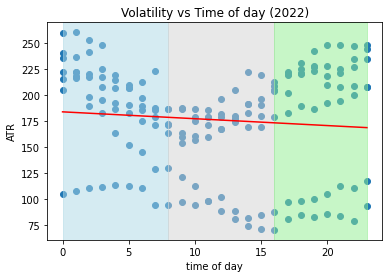

In [67]:
#find index of date for the most recent week

recent = df['2022-08-01':'2022-08-08']
last = df['2021-08-01':'2021-08-08']

average_true_range_scatter_recent = recent.average_true_range
hour_scatter_recent = recent.hour

x_values = np.array(hour_scatter_recent)
y_values = np.array(average_true_range_scatter_recent)

# type(x_values)
# print(x_values)

(slope, intercept, rvalue, pvalue, stderr)=linregress(x_values,y_values)
regress_values = x_values * slope + intercept
line_eq = "y= " + str(round(slope,2)) + "x +" + str(round(intercept, 2))

plt.scatter(x_values,y_values)
plt.plot(x_values, regress_values, "r-")

plt.title("Volatility vs Time of day (2022)")
plt.xlabel("time of day")
plt.ylabel("ATR")


plt.axvspan(hour_scatter_recent[0],hour_scatter_recent[8], color ='lightblue', alpha=0.5)
plt.axvspan(hour_scatter_recent[8],hour_scatter_recent[16], color ='lightgray', alpha=0.5)
plt.axvspan(hour_scatter_recent[16],hour_scatter_recent[23], color ='lightgreen', alpha=0.5)

plt.show()

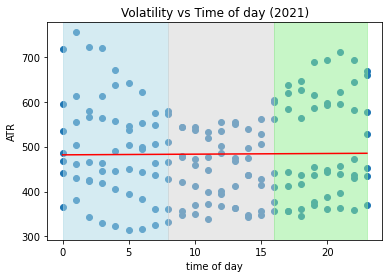

In [68]:
average_true_range_scatter_last = last.average_true_range
hour_scatter_last = last.hour

x_values = np.array(hour_scatter_last)
y_values = np.array(average_true_range_scatter_last)

# type(x_values)
# print(x_values)

(slope, intercept, rvalue, pvalue, stderr)=linregress(x_values,y_values)
regress_values = x_values * slope + intercept
line_eq = "y= " + str(round(slope,2)) + "x +" + str(round(intercept, 2))

plt.scatter(x_values,y_values)
plt.plot(x_values, regress_values, "r-")

plt.title("Volatility vs Time of day (2021)")
plt.xlabel("time of day")
plt.ylabel("ATR")

plt.axvspan(hour_scatter_recent[0],hour_scatter_recent[8], color ='lightblue', alpha=0.5)
plt.axvspan(hour_scatter_recent[8],hour_scatter_recent[16], color ='lightgray', alpha=0.5)
plt.axvspan(hour_scatter_recent[16],hour_scatter_recent[23], color ='lightgreen', alpha=0.5)

plt.show()

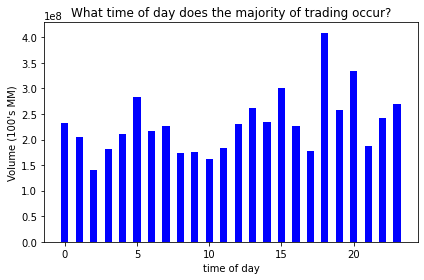

In [69]:
#plot bar chart volume vs. time of day
volume_scatter = df['volume(BTC)']
hour_scatter=df['hour']

x_axis = hour_scatter
y_axis = volume_scatter

plt.bar(x_axis, y_axis, color ="b", align ='center', width = .5)

#plt.rcParams["figure.figsize"] = [50, 50]
plt.title("What time of day does the majority of trading occur?")
plt.xlabel("time of day")
plt.ylabel("Volume (100's MM)")
plt.tight_layout()

plt.show()


In [70]:
end_date = datetime(2022,8,7)

start_date = end_date - dt.timedelta(days=63)

btcusd_1h['close']


window = 24*1

bitcoin_max = btcusd_1h['close'].rolling(window, min_periods=1).max()

hourly_drawdown = btcusd_1h['close']/bitcoin_max-1

bitcoin_draw = hourly_drawdown.rolling(window, min_periods=1).min()

bitcoin_draw 



0        0.000000
1       -0.000308
2       -0.002462
3       -0.006122
4       -0.006122
           ...   
14154   -0.017087
14155   -0.017087
14156   -0.017087
14157   -0.017087
14158   -0.017087
Name: close, Length: 14159, dtype: float64

In [71]:
hourly_drawdown


0        0.000000
1       -0.000308
2       -0.002462
3       -0.006122
4        0.000000
           ...   
14154   -0.014790
14155   -0.011848
14156   -0.008745
14157   -0.008141
14158   -0.006304
Name: close, Length: 14159, dtype: float64

In [72]:
bitcoin_draw_df = pd.DataFrame(columns=['Drawdowns'])
bitcoin_draw_df['Drawdowns'] = bitcoin_draw
bitcoin_draw_df.describe()

,Drawdowns
count,14159.000000
mean,-0.046997
std,0.033217
min,-0.222768
25%,-0.059523
50%,-0.039272
75%,-0.023740
max,0.000000


In [73]:
fig5 = go.Figure()



# set up layout
fig5.update_layout(
    title={
        'text' : "Loss percentage vs Date [Max Drawdown Analysis]",
        "x" : 0.5,
        'xanchor': 'center'
    },
    xaxis_title="Date",
    yaxis_title='Loss percentage',
    xaxis_rangeslider_visible=False
)

fig5.add_trace(
    go.Scatter(x=btcusd_1h['date'], y=bitcoin_draw, name="Max Drawdown")
    )

fig5.add_trace(
    go.Scatter(x=btcusd_1h['date'], y=hourly_drawdown, name="Hourly Drawdown")
    )

fig5.show()


In [74]:
# create a graph object
fig6 = go.Figure()

#set up layout
fig6.update_layout(
    title={
        'text' : "BTCUSD Candlestick (FTX)",
        "x" : 0.5,
        'xanchor': 'center'
    },
    xaxis_title="Date",
    yaxis_title='Price',
    xaxis_rangeslider_visible=False
)



fig6.add_trace(
    go.Scatter(x=btcusd_1h['date'], y=btcusd_1h['ohlc4'], name="OHLC4")
)
fig6.add_trace(
    go.Scatter(x=btcusd_1h['date'], y=btcusd_1h['SMA48'], name="SMA(48)")
)


fig6.show()

In [75]:
#locates maximum volume to be used in drawing a sample liquidation level for 2022-07-14
max13 = df['2022-07-13':'2022-07-14']
maxvol13 = max13.loc[max13['volume(BTC)'].idxmax()]
maxvol13

hour                  1.600000e+01
open                  1.943600e+04
high                  1.963500e+04
low                   1.916200e+04
close                 1.963500e+04
volume(BTC)           2.274430e+08
ohlc4                 1.946700e+04
SMA48                 1.975162e+04
average_true_range    3.035000e+02
EMA9                  1.950552e+04
EMA48                 1.979723e+04
10x short             2.155307e+04
25x short             2.021298e+04
50x short             1.980256e+04
100x short            1.960553e+04
10x long              1.781326e+04
25x long              1.884592e+04
50x long              1.921727e+04
100x long             1.940653e+04
Name: 2022-07-13 16:00:00, dtype: float64

### *Sample Liquidation level (orange dashed line) derived from price and volume point of control (POC) on 2022-07-13* 
Deriving support and resistance bands from the previous day point of control (highest volume), anticipates greatest liquidation volume at corresponding levels.

In [76]:
#sample visual for liquidation levels: need EMA does not work with SMA
Fig2 = go.Figure()

#set up layout
Fig2.update_layout(
    title={
        'text' : "BTCUSD Liquidation Levels",
        "x" : 0.5,
        'xanchor': 'center'
    },
    xaxis_title="Date",
    yaxis_title='Price',
    xaxis_rangeslider_visible=False
)

#add candletstick
Fig2.add_trace(
    go.Candlestick(
        x=btcusd_1h['date'],
        open=btcusd_1h['open'],
        high=btcusd_1h['high'],
        low=btcusd_1h['low'],
        close=btcusd_1h['close'],
        name="BTCUSD"
    )
)


Fig2.add_trace(
    go.Scatter(x=btcusd_1h['date'], y=btcusd_1h['10x long'], name="10x Rolling Liqs(long)"),
)
Fig2.add_trace(
  go.Scatter(x=btcusd_1h['date'], y=btcusd_1h['10x short'], name="10x Rolling Liqs(short)"),
)
Fig2.add_trace(
    go.Scatter(x=btcusd_1h['date'], y=btcusd_1h['25x long'], name="25x Rolling Liqs(long)"),
)
Fig2.add_trace(
  go.Scatter(x=btcusd_1h['date'], y=btcusd_1h['25x short'], name="25x Rolling Liqs(short)"),
)
Fig2.add_trace(
    go.Scatter(x=btcusd_1h['date'], y=btcusd_1h['50x long'], name="50x Rolling Liqs(long)"),
)
Fig2.add_trace(
  go.Scatter(x=btcusd_1h['date'], y=btcusd_1h['50x short'], name="50x Rolling Liqs(short)"),
)
Fig2.add_trace(
    go.Scatter(x=btcusd_1h['date'], y=btcusd_1h['100x long'], name="100x Rolling Liqs(long)"),
)
Fig2.add_trace(
  go.Scatter(x=btcusd_1h['date'], y=btcusd_1h['100x short'], name="100x Rolling Liqs(short)")
)

Fig2.add_hline(y=20212.978603, line_width=2, line_dash="dash", 
        line_color="orange", name="Projected 25x liquidation level for 2022-07-14")

Fig2.show()


### **Sample backtesting strategy for May30-Aug13(to date) 2022**

In [86]:
# df_backtest = df.tail(1272).reset_index(drop=False)
df_backtest = df.reset_index(drop=False)
df_backtest = df_backtest.tail(1440)
df_backtest

,date,hour,open,high,low,close,volume(BTC),ohlc4,SMA48,average_true_range,EMA9,EMA48,10x short,25x short,50x short,100x short,10x long,25x long,50x long,100x long
12719,2022-06-15 04:00:00,4.0,21401.0,21437.0,20875.0,21094.0,1.054960e+08,21201.75,22728.64,460.36,21779.40,23047.65,24065.64,22569.33,22111.07,21891.07,19889.86,21042.90,21457.54,21668.87
12720,2022-06-15 05:00:00,5.0,21094.0,21300.0,20700.0,21179.0,8.638594e+07,21068.25,22638.73,465.50,21637.17,22966.86,23908.48,22421.94,21966.67,21748.11,19759.97,20905.48,21317.41,21527.36
12721,2022-06-15 06:00:00,6.0,21179.0,21367.0,20904.0,21288.0,8.305040e+07,21184.50,22553.65,472.64,21546.64,22894.11,23808.44,22328.12,21874.76,21657.11,19677.29,20818.01,21228.21,21437.29
12722,2022-06-15 07:00:00,7.0,21288.0,21395.0,20599.0,20668.0,1.094414e+08,20987.50,22469.85,501.21,21434.81,22816.29,23684.87,22212.24,21761.23,21544.71,19575.17,20709.96,21118.04,21326.03
12723,2022-06-15 08:00:00,8.0,20661.0,20699.0,20120.0,20211.0,1.415386e+08,20422.75,22385.58,517.07,21232.40,22718.59,23461.21,22002.48,21555.73,21341.26,19390.32,20514.39,20918.62,21124.64
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14154,2022-08-13 23:00:00,23.0,24390.0,24504.0,24368.0,24447.0,1.217444e+07,24427.25,24263.13,148.50,24468.45,24336.94,27036.96,25355.91,24841.07,24593.91,22345.62,23641.02,24106.85,24344.27
14155,2022-08-14 00:00:00,0.0,24447.0,24521.0,24350.0,24520.0,8.810785e+06,24459.50,24274.17,147.36,24466.66,24341.95,27034.99,25354.05,24839.25,24592.11,22343.98,23639.29,24105.09,24342.49
14156,2022-08-14 01:00:00,1.0,24520.0,24645.0,24417.0,24597.0,1.683024e+07,24544.75,24286.69,147.36,24482.28,24350.22,27052.24,25370.24,24855.11,24607.80,22358.25,23654.38,24120.47,24358.03
14157,2022-08-14 02:00:00,2.0,24597.0,24625.0,24508.0,24612.0,8.566078e+06,24585.50,24299.66,143.71,24502.92,24359.83,27075.05,25391.63,24876.06,24628.55,22377.10,23674.32,24140.81,24378.57


In [87]:
pos_s = 0
pos_l = 0
num = 0
# pnl = []
profit = []
loss = []
percentchange = []


for i in df_backtest.index:
    
    price = df_backtest['ohlc4'][i]
    #short entry
    
    if(df_backtest['ohlc4'][i]>df_backtest['SMA48'][i]):
        if(df_backtest['high'][i]>=df_backtest['25x short'][i]):
            
            for j in  range(0,25):
                if(df_backtest['low'][i+j] <= df_backtest['50x long'][i+j]):
                    # print('long2')
                    if(pos_s==0):
                        sp=price
                        pos_s=1
                        print(f'entered short at {sp}')
           
    #exit short and track PnL
    elif(df_backtest['ohlc4'][i]<df_backtest['SMA48'][i]):
        if(df_backtest['high'][i] >= df_backtest['50x short'][i]):
                if(pos_s==1):
                    pos_s=0
                    bp=price
                    print(f'Exiting short at {bp}')
                    pc=(bp/sp-1)
                    percentchange.append(pc)
                    # pnl.append(-sp*pc)
                    if pc > 0:
                        loss.append(-sp*pc)
                    else:
                        profit.append(-sp*pc)
                        

                    
        if(num==df_backtest['ohlc4'].count()-1 and pos_s==1):
            pos_s=0
            bp=price
            print(f'Exiting short at {bp}')
            pc=(bp/sp-1)
            percentchange.append(pc)
            # pnl.append(-sp*pc)
            if pc > 0:
                loss.append(-sp*pc)
            else:
                profit.append(-sp*pc)
                        
              
                
        num+=1

# long entries
for i in df_backtest.index:  
    
    price = df_backtest['ohlc4'][i]
    
    if(df_backtest['ohlc4'][i]<df_backtest['SMA48'][i]):
        if(df_backtest['low'][i]<=df_backtest['25x long'][i]):
            
            for j in  range(0,24):
                if(df_backtest['high'][i+j] <= df_backtest['50x short'][i+j]):
                    if(pos_l==0):
                        bp=price
                        pos_l=1
                        print(f'entered long at {bp}')
                        
#     #exit long and track PnL
    elif(df_backtest['ohlc4'][i]>df_backtest['SMA48'][i]):
        if(df_backtest['low'][i] <= df_backtest['50x long'][i]):
                if(pos_l==1):
                    pos_l=0
                    sp=price
                    print(f'Exiting long at {sp}')
                    pc=(sp/bp-1)
                    percentchange.append(pc)
                    # pnl.append(sp*pc)
                    if pc > 0:
                        profit.append(bp*pc)
                    else:
                        loss.append(bp*pc)
                        
                    
        if(num==df_backtest['ohlc4'].count()-1 and pos_s==1):
            pos_l=0
            sp=price
            print(f'Exiting long at {sp}')
            pc=(sp/bp-1)
            percentchange.append(pc)
            # pnl.append(sp*pc)
            if pc > 0:
                profit.append(bp*pc)
            else:
                loss.append(bp*pc)
        num+=1
            
        
# #print percent change for each closed position
print(percentchange)
# #Check total number of iterations   
print(num)   
    

entered short at 21957.5
Exiting short at 20726.0
entered short at 19759.5
Exiting short at 19283.75
entered short at 19815.0
Exiting short at 20505.25
entered short at 20208.5
Exiting short at 19630.5
entered short at 22051.5
Exiting short at 22878.5
entered short at 22156.25
Exiting short at 23769.25
entered long at 21201.75
Exiting long at 21826.75
entered long at 21460.0
Exiting long at 19890.75
entered long at 19120.5
Exiting long at 20011.75
entered long at 19488.5
Exiting long at 21062.25
entered long at 21154.25
Exiting long at 22989.5
[-0.056085619947626064, -0.02407702624054253, 0.034834721170830196, -0.028601825964321925, 0.03750311770174375, 0.07280112834978847, 0.029478698692325, -0.07312441752096921, 0.0466122747836093, 0.08075275162275197, 0.08675561648368535]
1440


## Edge calculations
**The backtest was performed for the purpose of simulating a sample edge analysis and does not reflect the actual outcomes under real market conditions.

In [85]:
pl = round(len(loss)/len(percentchange),3)
pw = round(len(profit)/len(percentchange),3)
aw = round((sum(profit))/len(percentchange),2)
al = round((sum(loss))/len(percentchange),2)
n_trades = len(profit+loss)
        
total_pnl = sum(profit + loss)
# print(total_pnl)

print(f'Winning Percent: {round(pw*100,3)}%, Average Winner: {aw} ,  Losing Percent: {round(pl*100,3)}%,  Average Loser: {al},  Total Pnl: {round(total_pnl,2)}, Total Trades: {n_trades}')


edge = (pw * aw)-(pl*al)
edge

print(f'We can expect to make ${round(edge,2)} per BTC traded**')


Winning Percent: 66.7%, Average Winner: 604.69 ,  Losing Percent: 33.3%,  Average Loser: -347.81,  Total Pnl: 2312.0, Total Trades: 9
We can expect to make $519.15 per BTC traded**
